In [ ]:
raw_df = pd.read_csv('weatherAUS.csv')

In [ ]:
raw_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


The dataset contains over 145,460 rows and 23 columns. The dataset contains date, numeric and categorical columns.

Let's check the data types and missing values in the various columns.

In [ ]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

It might be a good idea to discard the rows where the value of `RainTomorrow` or `RainToday` is missing to make our analysis and modeling simpler (since one of them is the target variable, and the other is likely to be very closely related to the target variable). 

In [ ]:
raw_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)

## Exploratory Data Analysis and Visualization

Its always a good idea to explore the distributions of various columns and see how they are related to the target column. Let's explore and visualize the data using the `Plotly`, `Matplotlib` and `Seaborn` libraries.

In [ ]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'  #for setting environment

In [ ]:
px.histogram(raw_df, x='Location', 
             title='Location vs. Rainy Days', 
             color='RainToday')

> Observations:
> 1. We have an approx unifrom distribution of data across location.
> 2. Nhil, Darwin, Uluru reports least rain
> 3. Whatsonia receives most rain among 49 locations.
> 4. `Location` is definitely a factor in deciding whether it will rain tomorrow or not.

In [ ]:
px.histogram(raw_df, 
             x='Temp3pm', 
             title='Temperature at 3 pm vs. Rain Tomorrow', 
             color='RainTomorrow')

> Observation:
> 1. It is following a decent normal distribution.
> 2. When the temperature is lower, the chances of rain is quite higher.
> 3. Temperature at 3 PM plays a vital role in predicting whether it will rain tomorrow or not.

In [ ]:
px.histogram(raw_df, 
             x='RainTomorrow', 
             color='RainToday', 
             title='Rain Tomorrow vs. Rain Today')

> Observation: 
> 1. We have an class imbalance case(we don't have equal number of observations in each class)
> 2. If it didn't rain today, there is a pretty good chance that it will not rain tomorrow.
(predicting not rain is easier, than predicting rain for tomorrow)

In [ ]:
px.scatter(raw_df.sample(2000), 
           title='Min Temp. vs Max Temp.',
           x='MinTemp', 
           y='MaxTemp', 
           color='RainToday')

> Observation: 
> 1. It shows a linear positive correlation between minimum temperature and maximum temperature.
> 2. Points at the center is overlapping, indicating if it rains todays, variation in minimum and maximum temperature is low.

In [ ]:
px.scatter(raw_df.sample(2000), 
           title='Temp (3 pm) vs. Humidity (3 pm)',
           x='Temp3pm',
           y='Humidity3pm',
           color='RainTomorrow')

the temperature today is low and humidity is high, it may rain tomorrow.> Observations:
> 1. If the temperature today is low and humidity is high, it may rain tomorrow.
> 2. If temperature today is high and humidity is low, it may not rain tomorrow

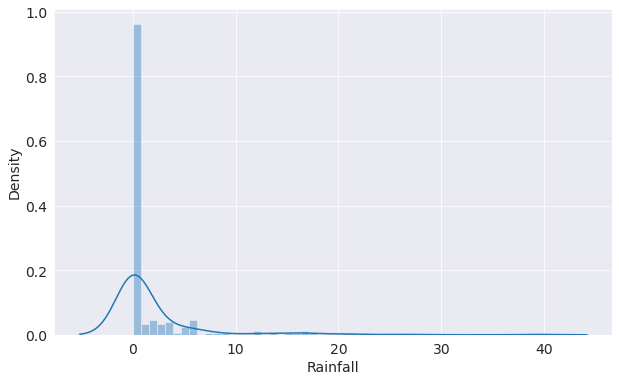

In [ ]:
sns.distplot(raw_df.Rainfall.sample(200));

> Observation:
> It is following a nice gaussian distribution.

In [ ]:
px.scatter(raw_df.sample(2000), 
           title='Pressure (3 pm) vs. Pressure (3 pm)',
           x='Pressure3pm',
           y='Pressure9am',
           color='RainTomorrow')

> Observations:
> 1. Pressure at 3PM is in a positive correlation with pressure at 9AM.
> 2. Since most of the points are overlapping, we can say that more  pressure at 9AM and 3PM results in no rain tomorrow.

In [ ]:
px.scatter(raw_df.sample(2000), 
           title='Temp (3 pm) vs. Temp (9 am)',
           x='Temp9am',
           y='Temp3pm',
           color='RainTomorrow')

> Observations:
> 1. Temperature and humidity at 3PM are positively correlated.
> 2. High temperature and humidity results in no rain tomorrow.

In [ ]:
raw_df.select_dtypes('float64').columns.tolist()

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [ ]:
px.histogram(raw_df, 
             x='Cloud3pm', 
             title='Cloud at 3 pm vs. Rain Tomorrow', 
             color='RainTomorrow')

> Observations:
> 1. More cloud at 3PM indicates fair chances of raining tomorrow
> 2. Whereas, for no rain, it is quite difficult to decide

In [ ]:
px.histogram(raw_df.sample(100), 
             x='Rainfall', 
             title='Rainfall vs. Rain Tomorrow', 
             color='RainTomorrow')

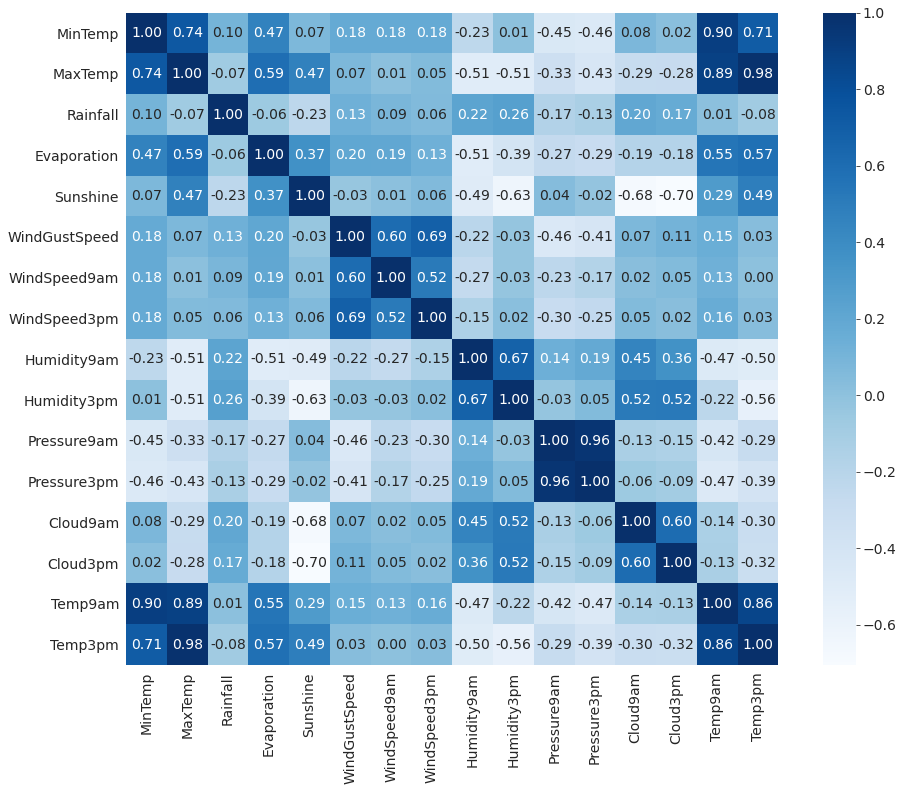

In [ ]:
plt.figure(figsize=(16,12))
sns.heatmap(raw_df.corr(), 
            square=True, 
            cmap='Blues', 
            annot=True, 
            fmt='.2f', 
            linecolor='white');

In [ ]:
numerical_columns = raw_df.select_dtypes('float64').columns

In [ ]:
numerical_columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')

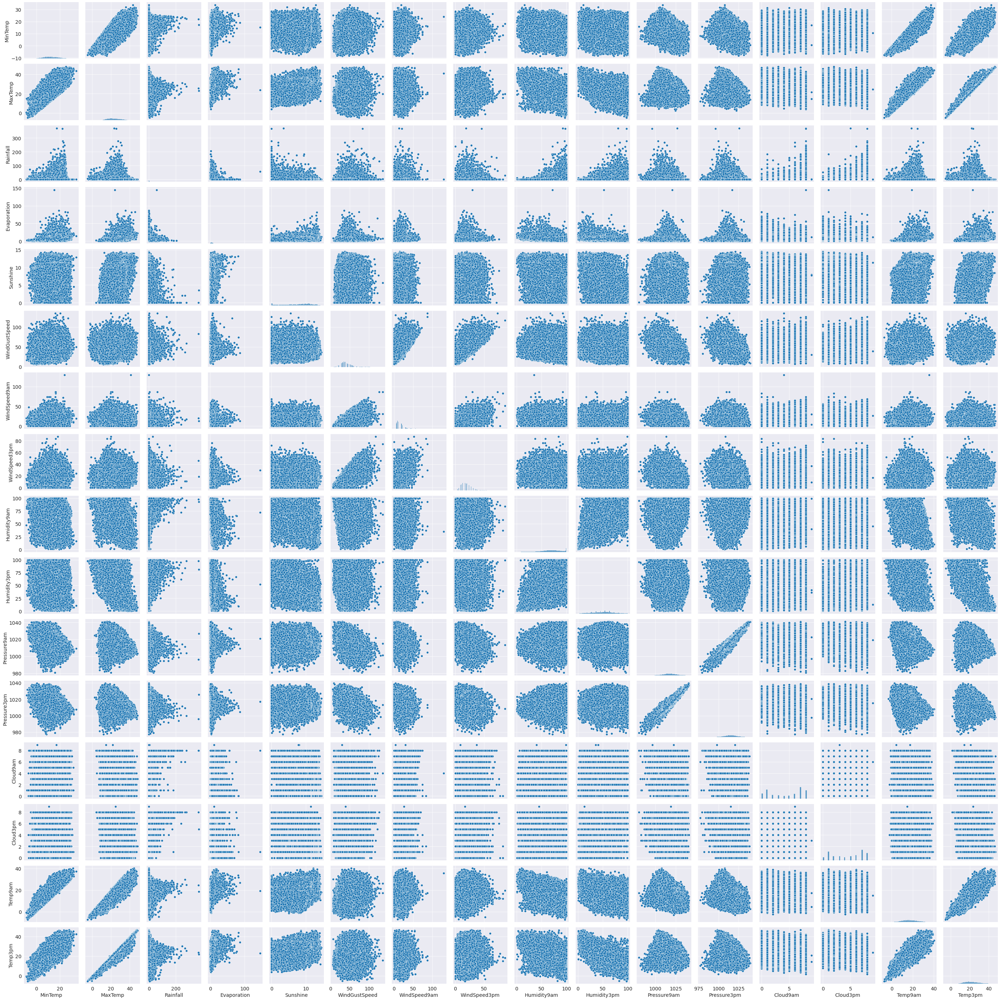

In [ ]:
sns.pairplot(raw_df[numerical_columns], kind='scatter', diag_kind='hist', palette='Rainbow');

> Observations:
> 1. Highly positive correlation can be found between few variables. Also, some have uniform distribution.


# THANK YOU FOR STICKING AROUND :)